# W3P2 - PART5 - model_building

assignment file part 4

----

Build a regression model.

In [101]:
import statsmodels.api as sm
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(color_codes=True)
sns.set_theme()

import warnings
warnings.filterwarnings('ignore')

In [35]:
df_yelpStns = pd.read_csv('../data/stats_mod/df_yelpStns_2330h.csv')
dfy= df_yelpStns.copy()

df_fsqStns = pd.read_csv('../data/stats_mod/df_fsqStns_2330h.csv')
dff= df_fsqStns.copy()

df_ctyBks = pd.read_csv('../data/stats_mod/df_ctyBks_stats_mod_sun2337h.csv')
dfcb = df_ctyBks.copy()
dfcb = dfcb[['free_bikes', 'empty_slots', 'slots', 'altitude',
       'ebikes', 'has_ebikes', 'normal_bikes', 'renting', 'returning', 'uid',
       'Updated', 'lat-long']]

-----
right now (5am in toronto), a closer look at the station data:

In [77]:
dfcb.head(3)

,free_bikes,empty_slots,slots,altitude,ebikes,has_ebikes,normal_bikes,renting,returning,uid,Updated,lat-long
0,18,1,19,0.0,0,True,18,1,1,7303,0628h,"43.665269,-79.319796"
1,6,8,15,0.0,0,True,6,1,1,7301,0628h,"43.67142,-79.445947"
2,9,13,23,0.0,0,True,9,1,1,7309,0628h,"43.666224,-79.317693"


In [79]:
dfcb['perc_avail'] = round(dfcb['free_bikes']/dfcb['slots'], 2)
dfcb.head()

,free_bikes,empty_slots,slots,altitude,ebikes,has_ebikes,normal_bikes,renting,returning,uid,Updated,lat-long,perc_avail
0,18,1,19,0.0,0,True,18,1,1,7303,0628h,"43.665269,-79.319796",0.95
1,6,8,15,0.0,0,True,6,1,1,7301,0628h,"43.67142,-79.445947",0.40
2,9,13,23,0.0,0,True,9,1,1,7309,0628h,"43.666224,-79.317693",0.39
3,19,4,25,0.0,0,True,19,1,1,7045,0628h,"43.653236,-79.376716",0.76
4,8,4,15,0.0,2,True,6,1,1,7044,0628h,"43.663722,-79.380288",0.53


In [76]:
dfcb[['perc_avail']]

----

In [59]:
yorkUniversity = [7759, 7758, 7756, 7679, 7585, 7586, 7584, 7759, 7679, 7678, 7587, 7588, 7589, 7590]
yorkUni = (7759, 7758, 7756, 7679, 7585, 7586, 7584, 7759, 7679, 7678, 7587, 7588, 7589, 7590)

scarboroughUni = [7612, 7613, 7624, 7614, 7615, 7616, 7617, 7645, 7626]
scarUni = (7612, 7613, 7624, 7614, 7615, 7616, 7617, 7645, 7626)

uni = (7612, 7613, 7624, 7614, 7615, 7616, 7617, 7645, 7626, 7759, 7758, 7756, 7679, 7585, 7586, 7584, 7759, 7679, 7678, 7587, 7588, 7589, 7590)

In [66]:
swPark = (7621, 7622, 7552, 7553, 7554, 7630, 7623, 7555, 7515, 7516, 7556, 7637, 7471, 7760, 7753, 7288, 7514, 7289, 7557)

In [65]:
dff.head(10)


,free_bikes,empty_slots,slots,altitude,ebikes,normal_bikes,renting,returning,uid,Updated,name,distance,popularity,open_now,rating,my_timestamp,cat1_id,cat1_name,perc_avail
0,18,1,19,0.0,0,18,1,1,7303,0628h,Leslieville Farmers Market,40,0.868580,False,8.6,2022-12-04 22:59:17.456850-05:00,17065,Farmers' Market,0.947368
1,18,1,19,0.0,0,18,1,1,7303,0628h,McDonald's,62,0.995501,False,7.4,2022-12-04 22:59:17.456868-05:00,13035,Coffee Shop,0.947368
2,18,1,19,0.0,0,18,1,1,7303,0628h,Rorschach Brewing,194,0.984511,False,8.3,2022-12-04 22:59:17.456875-05:00,17119,Bicycle Store,0.947368
3,18,1,19,0.0,0,18,1,1,7303,0628h,Velotique,186,0.968785,False,8.0,2022-12-04 22:59:17.456881-05:00,10039,Music Venue,0.947368
4,18,1,19,0.0,0,18,1,1,7303,0628h,Chick-N-Joy,129,0.035783,False,6.9,2022-12-04 22:59:17.456886-05:00,13011,Gay Bar,0.947368
5,18,1,19,0.0,0,18,1,1,7303,0628h,Jonathan Ashbridge Park,63,0.952623,False,NaN,2022-12-04 22:59:17.456900-05:00,13034,Café,0.947368
6,18,1,19,0.0,0,18,1,1,7303,0628h,O Sushi,300,0.936468,False,7.4,2022-12-04 22:59:17.456905-05:00,17096,Miscellaneous Store,0.947368
7,18,1,19,0.0,0,18,1,1,7303,0628h,Woodbine Park,379,0.992987,False,8.2,2022-12-04 22:59:17.456910-05:00,13026,BBQ Joint,0.947368
8,18,1,19,0.0,0,18,1,1,7303,0628h,Null,377,0.950868,False,8.0,2022-12-04 22:59:17.456916-05:00,11064,Hair Salon,0.947368
9,18,1,19,0.0,0,18,1,1,7303,0628h,Lcbo,420,0.976800,False,8.3,2022-12-04 22:59:17.456921-05:00,13236,Italian Restaurant,0.947368


In [63]:
dfy.head(10)

,free_bikes,empty_slots,slots,altitude,ebikes,normal_bikes,renting,returning,uid,name,distance,price,is_open,rating,rating_count,my_timestamp,cat1_title
0,18,1,19,0.0,0,18,1,1,7303,Maha's,1005.0,2.0,True,4.0,573,2022-12-04 23:15:10.587013-05:00,Egyptian
1,18,1,19,0.0,0,18,1,1,7303,The Burger's Priest,374.2,2.0,True,3.5,498,2022-12-04 23:15:10.587024-05:00,Italian
2,18,1,19,0.0,0,18,1,1,7303,Chino Locos Original,467.1,1.0,True,4.0,190,2022-12-04 23:15:10.587028-05:00,Burgers
3,18,1,19,0.0,0,18,1,1,7303,Lahore Tikka House,787.5,2.0,True,3.5,537,2022-12-04 23:15:10.587031-05:00,Canadian (New)
4,18,1,19,0.0,0,18,1,1,7303,Gio Rana's Really Really Nice Restaurant,881.1,3.0,True,4.0,227,2022-12-04 23:15:10.587034-05:00,Japanese
5,18,1,19,0.0,0,18,1,1,7303,Queen Margherita Pizza,353.2,2.0,True,3.5,188,2022-12-04 23:15:10.587037-05:00,Ramen
6,18,1,19,0.0,0,18,1,1,7303,Lake Inez,794.7,3.0,True,4.5,92,2022-12-04 23:15:10.587041-05:00,Japanese
7,18,1,19,0.0,0,18,1,1,7303,Sweet Bliss Baking Company,688.9,1.0,True,4.5,62,2022-12-04 23:15:10.587043-05:00,Lounges
8,18,1,19,0.0,0,18,1,1,7303,Udupi Palace,839.4,2.0,True,3.5,204,2022-12-04 23:15:10.587046-05:00,Sandwiches
9,18,1,19,0.0,0,18,1,1,7303,Lazy Daisy's Cafe,828.7,2.0,True,4.0,146,2022-12-04 23:15:10.587050-05:00,Seafood


In [60]:

dfcb[dfcb['uid'].isin(uni)]

,Unnamed: 0,free_bikes,empty_slots,slots,altitude,ebikes,has_ebikes,normal_bikes,renting,returning,uid,Updated,lat-long
408,408,6,19,27,0.0,0,True,6,1,1,7584,0628h,"43.7696262,-79.5025943"
409,409,13,14,27,0.0,0,True,13,1,1,7585,0628h,"43.7641485,-79.5012809"
410,410,20,3,23,0.0,0,True,20,1,1,7586,0628h,"43.76521,-79.491281"
411,411,4,15,19,0.0,0,True,4,1,1,7587,0628h,"43.7724019,-79.4675395"
412,412,14,17,31,0.0,0,True,14,1,1,7588,0628h,"43.7781116,-79.467963"
429,429,3,7,11,0.0,0,True,3,1,1,7624,0628h,"43.754978,-79.1971289"
434,434,10,13,23,0.0,0,True,10,1,1,7617,0628h,"43.788319,-79.123505"
435,435,9,16,25,0.0,0,True,9,1,1,7626,0628h,"43.7805505,-79.1301203"
436,436,11,15,27,0.0,0,True,11,1,1,7615,0628h,"43.7777114,-79.1659711"
437,437,0,23,23,0.0,0,True,0,1,1,7614,0628h,"43.779353,-79.193023"


In [10]:


print(dfy.shape)
print(dfy.dtypes)
dfy.head(5)

(30828, 17)
free_bikes        int64
empty_slots       int64
slots             int64
altitude        float64
ebikes            int64
normal_bikes      int64
renting           int64
returning         int64
uid               int64
name             object
distance        float64
price           float64
is_open            bool
rating          float64
rating_count      int64
my_timestamp     object
cat1_title       object
dtype: object


,free_bikes,empty_slots,slots,altitude,ebikes,normal_bikes,renting,returning,uid,name,distance,price,is_open,rating,rating_count,my_timestamp,cat1_title
0,18,1,19,0.0,0,18,1,1,7303,Maha's,1005.0,2.0,True,4.0,573,2022-12-04 23:15:10.587013-05:00,Egyptian
1,18,1,19,0.0,0,18,1,1,7303,The Burger's Priest,374.2,2.0,True,3.5,498,2022-12-04 23:15:10.587024-05:00,Italian
2,18,1,19,0.0,0,18,1,1,7303,Chino Locos Original,467.1,1.0,True,4.0,190,2022-12-04 23:15:10.587028-05:00,Burgers
3,18,1,19,0.0,0,18,1,1,7303,Lahore Tikka House,787.5,2.0,True,3.5,537,2022-12-04 23:15:10.587031-05:00,Canadian (New)
4,18,1,19,0.0,0,18,1,1,7303,Gio Rana's Really Really Nice Restaurant,881.1,3.0,True,4.0,227,2022-12-04 23:15:10.587034-05:00,Japanese


In [29]:
dfy['is_open'].value_counts()

True    30828
Name: is_open, dtype: int64

In [32]:
# order in array above will be same as the keys,
keys = dfy['is_open'].unique()
# Setting ordinal numerical values to match the order:
values = [1]
open_map = dict(zip(keys, values))
open_map

{True: 1}

In [33]:
dfy['is_open'] = dfy['is_open'].map(open_map)

In [51]:
dff.head()

,free_bikes,empty_slots,slots,altitude,ebikes,normal_bikes,renting,returning,uid,Updated,name,distance,popularity,open_now,rating,my_timestamp,cat1_id,cat1_name
0,18,1,19,0.0,0,18,1,1,7303,0628h,Leslieville Farmers Market,40,0.868580,False,8.6,2022-12-04 22:59:17.456850-05:00,17065,Farmers' Market
1,18,1,19,0.0,0,18,1,1,7303,0628h,McDonald's,62,0.995501,False,7.4,2022-12-04 22:59:17.456868-05:00,13035,Coffee Shop
2,18,1,19,0.0,0,18,1,1,7303,0628h,Rorschach Brewing,194,0.984511,False,8.3,2022-12-04 22:59:17.456875-05:00,17119,Bicycle Store
3,18,1,19,0.0,0,18,1,1,7303,0628h,Velotique,186,0.968785,False,8.0,2022-12-04 22:59:17.456881-05:00,10039,Music Venue
4,18,1,19,0.0,0,18,1,1,7303,0628h,Chick-N-Joy,129,0.035783,False,6.9,2022-12-04 22:59:17.456886-05:00,13011,Gay Bar


In [57]:
dff['perc_avail'] = dff['free_bikes']/dff['slots']
dff

,free_bikes,empty_slots,slots,altitude,ebikes,normal_bikes,renting,returning,uid,Updated,name,distance,popularity,open_now,rating,my_timestamp,cat1_id,cat1_name,perc_avail
0,18,1,19,0.0,0,18,1,1,7303,0628h,Leslieville Farmers Market,40,0.868580,False,8.6,2022-12-04 22:59:17.456850-05:00,17065,Farmers' Market,0.947368
1,18,1,19,0.0,0,18,1,1,7303,0628h,McDonald's,62,0.995501,False,7.4,2022-12-04 22:59:17.456868-05:00,13035,Coffee Shop,0.947368
2,18,1,19,0.0,0,18,1,1,7303,0628h,Rorschach Brewing,194,0.984511,False,8.3,2022-12-04 22:59:17.456875-05:00,17119,Bicycle Store,0.947368
3,18,1,19,0.0,0,18,1,1,7303,0628h,Velotique,186,0.968785,False,8.0,2022-12-04 22:59:17.456881-05:00,10039,Music Venue,0.947368
4,18,1,19,0.0,0,18,1,1,7303,0628h,Chick-N-Joy,129,0.035783,False,6.9,2022-12-04 22:59:17.456886-05:00,13011,Gay Bar,0.947368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32704,0,14,15,0.0,0,0,1,1,7759,0628h,Grocery Checkout York,859,0.606624,False,NaN,2022-12-04 23:07:25.641123-05:00,13263,Japanese Restaurant,0.000000
32705,0,14,15,0.0,0,0,1,1,7759,0628h,Basil Box,860,0.824950,False,NaN,2022-12-04 23:07:25.641126-05:00,13034,Café,0.000000
32706,0,14,15,0.0,0,0,1,1,7759,0628h,Dynamacs,862,0.727079,False,NaN,2022-12-04 23:07:25.641137-05:00,13040,Dessert Shop,0.000000
32707,0,14,15,0.0,0,0,1,1,7759,0628h,York University - Department of Psychology,653,NaN,False,NaN,2022-12-04 23:07:25.641139-05:00,13073,Australian Restaurant,0.000000


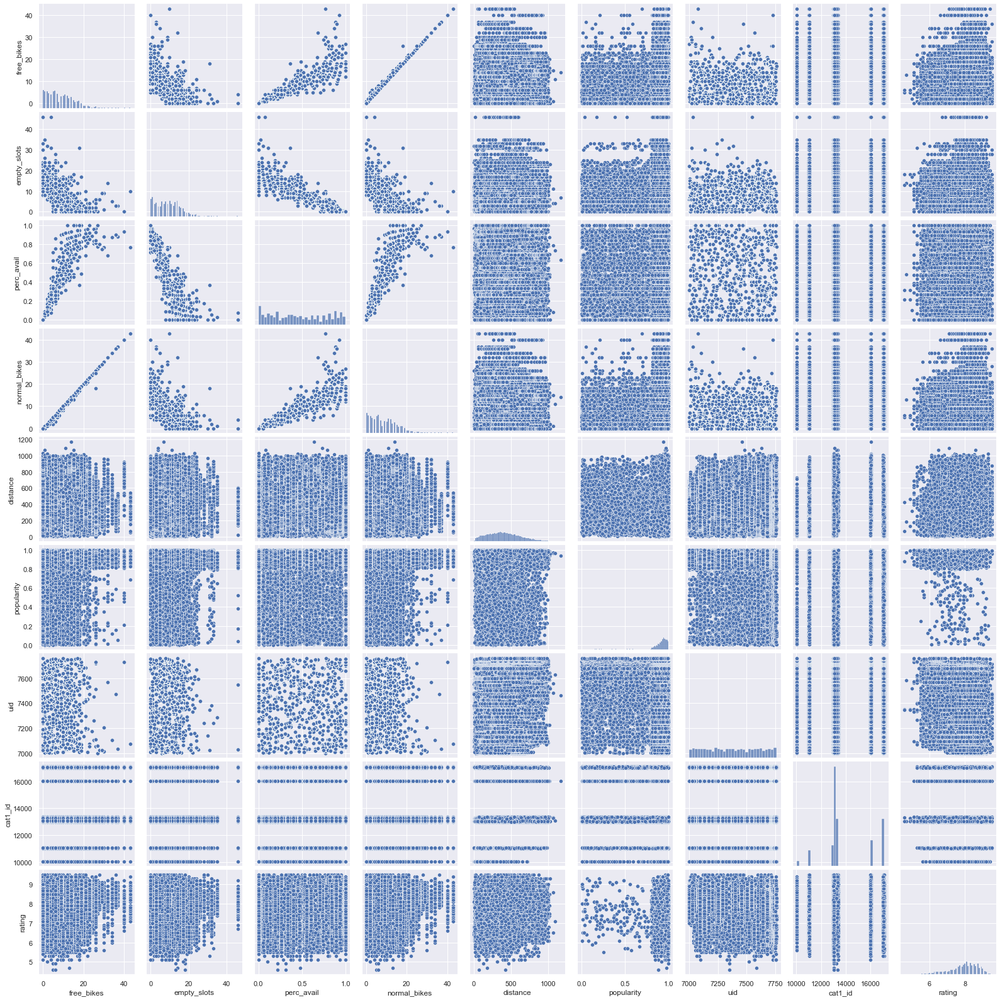

In [58]:
df = dff[['free_bikes', 'empty_slots', 'perc_avail', 'normal_bikes', 'distance', 'popularity', 'uid', 'cat1_id', 'rating']]

sns.pairplot(data=df)
plt.show()

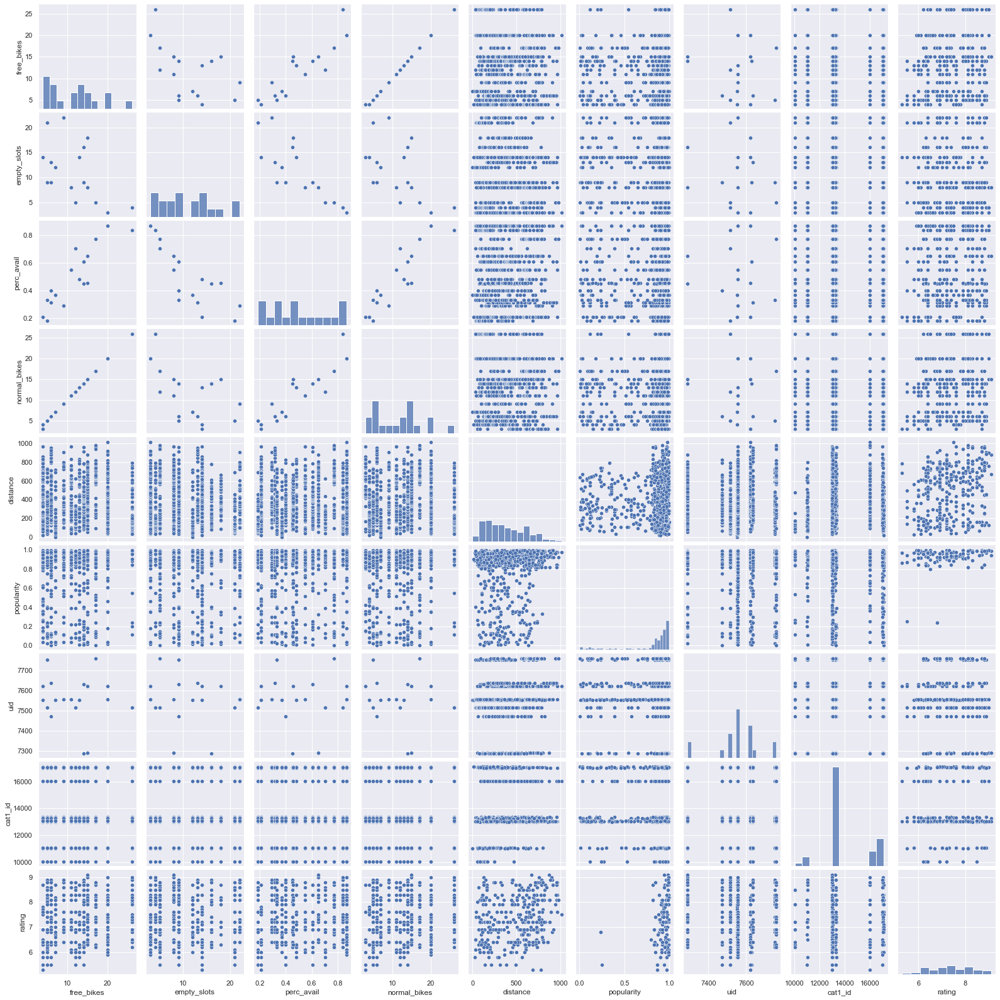

In [67]:

df_swPark = df[df['uid'].isin(swPark)]
df_uni = df[df['uid'].isin(uni)]
df_uniCoffee = df_uni[df_uni['cat1_id']==13035]

sns.pairplot(data=df_swPark)
plt.show()

In [71]:
# df_swPark.head()
swPark_dff = dff[dff['uid'].isin(swPark)]
print(swPark_dff.shape)
swPark_dff.head()

(950, 19)


,free_bikes,empty_slots,slots,altitude,ebikes,normal_bikes,renting,returning,uid,Updated,name,distance,popularity,open_now,rating,my_timestamp,cat1_id,cat1_name,perc_avail
12100,15,8,23,0.0,0,15,1,1,7289,0628h,Humber River Footbridge,130,0.994978,False,9.0,2022-12-04 23:02:34.232240-05:00,17065,Farmers' Market,0.652174
12101,15,8,23,0.0,0,15,1,1,7289,0628h,Sheldon Lookout Rock,108,0.978742,False,8.2,2022-12-04 23:02:34.232260-05:00,13035,Coffee Shop,0.652174
12102,15,8,23,0.0,0,15,1,1,7289,0628h,Humber Bay Arch Bridge,161,0.988400,False,8.7,2022-12-04 23:02:34.232268-05:00,17119,Bicycle Store,0.652174
12103,15,8,23,0.0,0,15,1,1,7289,0628h,Palace Place Foods,55,0.843103,False,NaN,2022-12-04 23:02:34.232275-05:00,10039,Music Venue,0.652174
12104,15,8,23,0.0,0,15,1,1,7289,0628h,Rustic Social House,353,0.904214,False,7.2,2022-12-04 23:02:34.232282-05:00,13011,Gay Bar,0.652174


In [12]:


print(dff.shape)
print(dff.isna().sum())
dff.head(5)

(32709, 18)
free_bikes         0
empty_slots        0
slots              0
altitude         500
ebikes             0
normal_bikes       0
renting            0
returning          0
uid                0
Updated            0
name               0
distance           0
popularity      1635
open_now           0
rating          8278
my_timestamp       0
cat1_id            0
cat1_name          0
dtype: int64


,free_bikes,empty_slots,slots,altitude,ebikes,normal_bikes,renting,returning,uid,Updated,name,distance,popularity,open_now,rating,my_timestamp,cat1_id,cat1_name
0,18,1,19,0.0,0,18,1,1,7303,0628h,Leslieville Farmers Market,40,0.868580,False,8.6,2022-12-04 22:59:17.456850-05:00,17065,Farmers' Market
1,18,1,19,0.0,0,18,1,1,7303,0628h,McDonald's,62,0.995501,False,7.4,2022-12-04 22:59:17.456868-05:00,13035,Coffee Shop
2,18,1,19,0.0,0,18,1,1,7303,0628h,Rorschach Brewing,194,0.984511,False,8.3,2022-12-04 22:59:17.456875-05:00,17119,Bicycle Store
3,18,1,19,0.0,0,18,1,1,7303,0628h,Velotique,186,0.968785,False,8.0,2022-12-04 22:59:17.456881-05:00,10039,Music Venue
4,18,1,19,0.0,0,18,1,1,7303,0628h,Chick-N-Joy,129,0.035783,False,6.9,2022-12-04 22:59:17.456886-05:00,13011,Gay Bar


In [16]:
df = dff[['free_bikes', 'empty_slots', 'slots', 'normal_bikes', 'distance', 'popularity', 'rating']]

sns.pairplot(data=df, alpha = 0.6)
plt.show()

TypeError: pairplot() got an unexpected keyword argument 'alpha'

Provide model output and an interpretation of the results. 

# Stretch

How can you turn the regression model into a classification model?

In [91]:
df = df.drop(['renting', 'returning', 'Updated', 'my_timestamp'], axis=1)
# dff = dff.drop(['ebikes', 'altitude'], axis=1)
df = df[df['open_now']==True]

In [97]:
df = df[df['distance']<400]
df.columns
df=df[['uid'
, 'free_bikes'
, 'empty_slots'
, 'slots'
, 'perc_avail'
, 'distance'
, 'open_now'
, 'cat1_id'
, 'cat1_name'
, 'name'
, 'rating'
, 'popularity']]

In [104]:
df = df[df.columns[~df.columns.isin(['open_now'])]]
df.head()

,uid,free_bikes,empty_slots,slots,perc_avail,distance,cat1_id,cat1_name,name,rating,popularity
10,7303,18,1,19,0.947368,265,17018,Bookstore,Tulip Restaurant,6.8,0.881238
16,7303,18,1,19,0.947368,299,13034,Café,Burrito Bandidos,6.7,0.924825
31,7303,18,1,19,0.947368,346,13377,Vegan and Vegetarian Restaurant,KFC,5.6,0.904456
52,7301,6,8,15,0.400000,339,17119,Bicycle Store,Rehearsal Factory,7.0,0.961155
103,7309,9,13,23,0.391304,68,10039,Music Venue,Tulip Restaurant,6.8,0.881238


<AxesSubplot: >

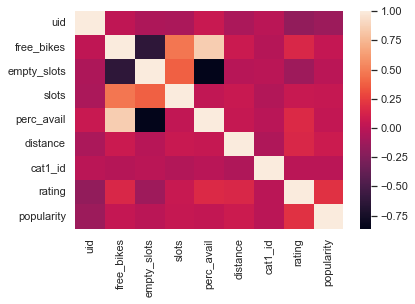

In [105]:
sns.heatmap(df.corr())

In [106]:
df.corr()

,uid,free_bikes,empty_slots,slots,perc_avail,distance,cat1_id,rating,popularity
uid,1.000000,0.018154,-0.063111,-0.068837,0.060386,-0.069701,-0.008186,-0.178375,-0.135461
free_bikes,0.018154,1.000000,-0.635101,0.464776,0.851879,0.066328,-0.027894,0.148958,0.037563
empty_slots,-0.063111,-0.635101,1.000000,0.376165,-0.860920,-0.018626,-0.004735,-0.130091,-0.006846
slots,-0.068837,0.464776,0.376165,1.000000,0.020237,0.061732,-0.040453,0.048166,0.044854
perc_avail,0.060386,0.851879,-0.860920,0.020237,1.000000,0.046827,-0.012663,0.161708,0.032028
distance,-0.069701,0.066328,-0.018626,0.061732,0.046827,1.000000,-0.054610,0.143384,0.073923
cat1_id,-0.008186,-0.027894,-0.004735,-0.040453,-0.012663,-0.054610,1.000000,-0.005206,-0.005339
rating,-0.178375,0.148958,-0.130091,0.048166,0.161708,0.143384,-0.005206,1.000000,0.194452
popularity,-0.135461,0.037563,-0.006846,0.044854,0.032028,0.073923,-0.005339,0.194452,1.000000


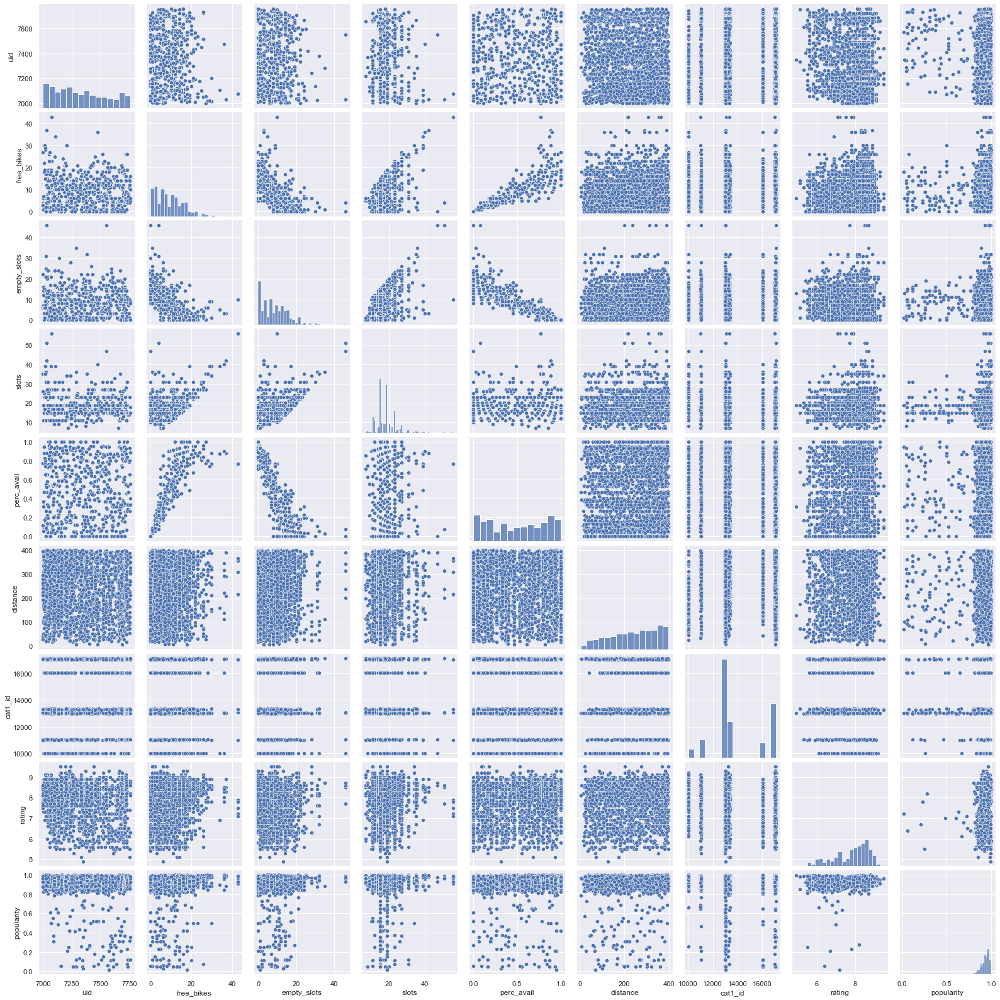

In [107]:
sns.pairplot(data=df)
plt.show()

In [99]:
import pandas_profiling

pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]